## **Fase 2 - Transform**

*En esta fase del proceso ETL, nos centramos en transformar los datos extraídos para adecuarlos para el análisis posterior. La transformación incluye la limpieza de datos, conversión de tipos de datos y creación de nuevas columnas relevantes. Estas acciones permiten mejorar la calidad y la utilidad de los datos, facilitando un análisis más preciso y efectivo. La transformación asegura que los datos estén en un formato coherente y listo para ser utilizado y analizado con gráficos de visualización para entender cómo se correlacionan las columnas y poder identificar patrones en los datos.*.

In [3]:
# ⁠General
import numpy as np
import pandas as pd
from datetime import datetime

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import folium

In [ ]:
df = pd.read_csv('df_before_clean.csv')

In [5]:
df.head()

,urls,timestamp,record_id,Titles,Host_name,Property_types,Prices_per_night,Check_ins,Check_outs,Cleaning_fees,Location,Ratings,Num_reviews,Camas,Baños,Maximum_guests,Viajeros,Dormitorios,Otros
0,https://www.airbnb.es/rooms/127026646934000621...,2024-11-04 14:30:46,1270266469340006214,Cancelación gratuita antes del 24 nov. Si canc...,Anfitrión: Joar,"Habitación en Barcelona, España",46 €,Llegada a partir de las 10:00,Salida antes de las 12:00,10 €,"Barcelona, Catalunya, España",Nuevo,NaN,1 cama,Baño compartido,2.0,NaN,NaN,NaN
1,https://www.airbnb.es/rooms/124325414712095935...,2024-11-04 14:30:46,1243254147120959358,Este alojamiento tiene una ubicación estratégi...,Anfitrión: Valentina Sofia,"Habitación en Barcelona, España",45 €,Horario de llegada: de 15:00 a 23:00,Salida antes de las 11:00,20 €,"Barcelona, Catalunya, España",Nuevo,NaN,1 cama,Baño compartido,NaN,NaN,NaN,NaN
2,https://www.airbnb.es/rooms/126816381898072972...,2024-11-04 14:30:46,1268163818980729724,¡Bienvenido a tu escapada perfecta en el coraz...,Anfitrión: Joonas,"Alojamiento entero: apartamento en Barcelona, ...",147 €,Llegada a partir de las 15:00,Salida antes de las 12:00,126 €,"Barcelona, Catalunya, España",Nuevo,NaN,2 camas,1 baño,4.0,4 viajeros,2 dormitorios,NaN
3,https://www.airbnb.es/rooms/44247318?adults=1&...,2024-11-04 14:30:46,44247318,ACOGEDOR APARTAMENTO DE PLAYA DE 1 DORMITORIO ...,Anfitrión: Jan,"Alojamiento entero: apartamento en Barcelona, ...",55 €,Horario de llegada: de 18:00 a 23:00,Salida antes de las 11:00,80 €,"Barcelona, Catalunya, España","4,68",19.0,1 cama,1 baño,2.0,2 viajeros,1 dormitorio,NaN
4,https://www.airbnb.es/rooms/119269213083576009...,2024-11-04 14:30:46,1192692130835760091,Disfruta de la privacidad de este alojamiento...,Anfitrión: Ele,"Habitación privada en: loft en Barcelona, España",56 €,Horario de llegada: de 14:00 a 21:00,Salida antes de las 12:00,48 €,"Barcelona, Catalunya, España","5,0",4.0,2 camas,1 baño privado,1.0,1 viajero,1 dormitorio,NaN


In [6]:
df.shape

(500, 19)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   urls              500 non-null    object 
 1   timestamp         500 non-null    object 
 2   record_id         500 non-null    int64  
 3   Titles            500 non-null    object 
 4   Host_name         500 non-null    object 
 5   Property_types    500 non-null    object 
 6   Prices_per_night  498 non-null    object 
 7   Check_ins         500 non-null    object 
 8   Check_outs        500 non-null    object 
 9   Cleaning_fees     401 non-null    object 
 10  Location          249 non-null    object 
 11  Ratings           393 non-null    object 
 12  Num_reviews       335 non-null    float64
 13  Camas             479 non-null    object 
 14  Baños             495 non-null    object 
 15  Maximum_guests    499 non-null    float64
 16  Viajeros          326 non-null    object 
 1

In [8]:
df.describe()

,record_id,Num_reviews,Maximum_guests
count,5.000000e+02,335.000000,499.000000
mean,5.339993e+17,249.122388,2.995992
std,5.622764e+17,352.493810,1.700456
min,4.098300e+04,2.000000,1.000000
25%,2.355537e+07,31.000000,2.000000
50%,5.332366e+07,146.000000,2.000000
75%,1.176611e+18,353.000000,4.000000
max,1.279041e+18,2770.000000,10.000000


In [9]:
df.columns

Index(['urls', 'timestamp', 'record_id', 'Titles', 'Host_name',
       'Property_types', 'Prices_per_night', 'Check_ins', 'Check_outs',
       'Cleaning_fees', 'Location', 'Ratings', 'Num_reviews', 'Camas', 'Baños',
       'Maximum_guests', 'Viajeros', 'Dormitorios', 'Otros'],
      dtype='object')

In [10]:
df.isna().sum()

urls                  0
timestamp             0
record_id             0
Titles                0
Host_name             0
Property_types        0
Prices_per_night      2
Check_ins             0
Check_outs            0
Cleaning_fees        99
Location            251
Ratings             107
Num_reviews         165
Camas                21
Baños                 5
Maximum_guests        1
Viajeros            174
Dormitorios         180
Otros               471
dtype: int64

In [11]:
### Drop de columnas repetidas
df = df.drop('Viajeros', axis = 1 )
df = df.drop('Otros', axis = 1 )

### Host_name

In [13]:
df['Host_name'].unique()

array(['Anfitrión: Joar', 'Anfitrión: Valentina Sofia',
       'Anfitrión: Joonas', 'Anfitrión: Jan', 'Anfitrión: Ele',
       'Quédate con Magdalena', 'Anfitrión: David',
       'Anfitrión: Generator', 'Anfitrión: Badajoz', 'Anfitrión: Carmen',
       'Quédate con Guido', 'Anfitrión: St Christophers Barcelona',
       'Anfitrión: Danny', 'Anfitrión: Mada', 'Quédate con Cleudes',
       'Anfitrión: Raffaele', 'Quédate con Alerson',
       'Anfitrión: Unite Hostel', 'Anfitrión: Hola',
       'Anfitrión: Green House', 'Quédate con Reno',
       'Anfitrión: Antonia Y Andres',
       'Anfitrión: Barcelona Urbany Hostel', 'Anfitrión: Gian',
       'Quédate con Mate', 'Quédate con Alvie', 'Anfitrión: Joan',
       'Anfitrión: Nanou', 'Anfitrión: Lfdg Hostels', 'Anfitrión: Anders',
       'Anfitrión: Robinson', 'Anfitrión: Carmen Luisa',
       'Anfitrión: Valerie', 'Anfitrión: Oscar Y Susana',
       'Anfitrión: Natalia', 'Anfitrión: Ashley', 'Anfitrión: Carlos',
       'Anfitrión: Anna', 'A

In [14]:
# Extraer solo el nombre del anfitrión, removendo "Anfitrión: " y cualquier outro prefixo
df['Host_name'] = df['Host_name'].str.replace('Anfitrión: ', '', regex=False).str.replace('Quédate con ', '', regex=False)

### Property_Types

In [16]:
# Definir una funcion para formatear y limpiar la columna Propoerty_Types
def category_types(value):
    if "Alojamiento entero" in value:
        return "Alojamiento entero"
    elif "Habitación" in value:
        return "Habitación"
    else:
        return "otro"

In [17]:
df["Property_types"] = df["Property_types"].apply(category_types)


In [18]:
df.head()

,urls,timestamp,record_id,Titles,Host_name,Property_types,Prices_per_night,Check_ins,Check_outs,Cleaning_fees,Location,Ratings,Num_reviews,Camas,Baños,Maximum_guests,Dormitorios
0,https://www.airbnb.es/rooms/127026646934000621...,2024-11-04 14:30:46,1270266469340006214,Cancelación gratuita antes del 24 nov. Si canc...,Joar,Habitación,46 €,Llegada a partir de las 10:00,Salida antes de las 12:00,10 €,"Barcelona, Catalunya, España",Nuevo,NaN,1 cama,Baño compartido,2.0,NaN
1,https://www.airbnb.es/rooms/124325414712095935...,2024-11-04 14:30:46,1243254147120959358,Este alojamiento tiene una ubicación estratégi...,Valentina Sofia,Habitación,45 €,Horario de llegada: de 15:00 a 23:00,Salida antes de las 11:00,20 €,"Barcelona, Catalunya, España",Nuevo,NaN,1 cama,Baño compartido,NaN,NaN
2,https://www.airbnb.es/rooms/126816381898072972...,2024-11-04 14:30:46,1268163818980729724,¡Bienvenido a tu escapada perfecta en el coraz...,Joonas,Alojamiento entero,147 €,Llegada a partir de las 15:00,Salida antes de las 12:00,126 €,"Barcelona, Catalunya, España",Nuevo,NaN,2 camas,1 baño,4.0,2 dormitorios
3,https://www.airbnb.es/rooms/44247318?adults=1&...,2024-11-04 14:30:46,44247318,ACOGEDOR APARTAMENTO DE PLAYA DE 1 DORMITORIO ...,Jan,Alojamiento entero,55 €,Horario de llegada: de 18:00 a 23:00,Salida antes de las 11:00,80 €,"Barcelona, Catalunya, España","4,68",19.0,1 cama,1 baño,2.0,1 dormitorio
4,https://www.airbnb.es/rooms/119269213083576009...,2024-11-04 14:30:46,1192692130835760091,Disfruta de la privacidad de este alojamiento...,Ele,Habitación,56 €,Horario de llegada: de 14:00 a 21:00,Salida antes de las 12:00,48 €,"Barcelona, Catalunya, España","5,0",4.0,2 camas,1 baño privado,1.0,1 dormitorio


In [19]:
df.isna().sum()

urls                  0
timestamp             0
record_id             0
Titles                0
Host_name             0
Property_types        0
Prices_per_night      2
Check_ins             0
Check_outs            0
Cleaning_fees        99
Location            251
Ratings             107
Num_reviews         165
Camas                21
Baños                 5
Maximum_guests        1
Dormitorios         180
dtype: int64

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   urls              500 non-null    object 
 1   timestamp         500 non-null    object 
 2   record_id         500 non-null    int64  
 3   Titles            500 non-null    object 
 4   Host_name         500 non-null    object 
 5   Property_types    500 non-null    object 
 6   Prices_per_night  498 non-null    object 
 7   Check_ins         500 non-null    object 
 8   Check_outs        500 non-null    object 
 9   Cleaning_fees     401 non-null    object 
 10  Location          249 non-null    object 
 11  Ratings           393 non-null    object 
 12  Num_reviews       335 non-null    float64
 13  Camas             479 non-null    object 
 14  Baños             495 non-null    object 
 15  Maximum_guests    499 non-null    float64
 16  Dormitorios       320 non-null    object 
dt

### Prices

In [22]:
# Remover el símbolo del euro y convertir a valores numéricos, sustituyendo valores no válidos por 0
df['Prices_per_night'] = pd.to_numeric(df['Prices_per_night'].str.replace('€', '').str.strip(), errors='coerce')

# Yo usaria esto en lugar de rellenar los nan con 0 y aque es nuestra target 
df = df.dropna(subset=['Prices_per_night'])
#Y luego ya se hace lo del .astype()

### Cleaning Fee

In [24]:
df['Cleaning_fees'] = pd.to_numeric(df['Cleaning_fees'].str.replace('€', '').str.strip(), errors='coerce') #.fillna(0)

In [25]:
df.head()

,urls,timestamp,record_id,Titles,Host_name,Property_types,Prices_per_night,Check_ins,Check_outs,Cleaning_fees,Location,Ratings,Num_reviews,Camas,Baños,Maximum_guests,Dormitorios
0,https://www.airbnb.es/rooms/127026646934000621...,2024-11-04 14:30:46,1270266469340006214,Cancelación gratuita antes del 24 nov. Si canc...,Joar,Habitación,46.0,Llegada a partir de las 10:00,Salida antes de las 12:00,10.0,"Barcelona, Catalunya, España",Nuevo,NaN,1 cama,Baño compartido,2.0,NaN
1,https://www.airbnb.es/rooms/124325414712095935...,2024-11-04 14:30:46,1243254147120959358,Este alojamiento tiene una ubicación estratégi...,Valentina Sofia,Habitación,45.0,Horario de llegada: de 15:00 a 23:00,Salida antes de las 11:00,20.0,"Barcelona, Catalunya, España",Nuevo,NaN,1 cama,Baño compartido,NaN,NaN
2,https://www.airbnb.es/rooms/126816381898072972...,2024-11-04 14:30:46,1268163818980729724,¡Bienvenido a tu escapada perfecta en el coraz...,Joonas,Alojamiento entero,147.0,Llegada a partir de las 15:00,Salida antes de las 12:00,126.0,"Barcelona, Catalunya, España",Nuevo,NaN,2 camas,1 baño,4.0,2 dormitorios
3,https://www.airbnb.es/rooms/44247318?adults=1&...,2024-11-04 14:30:46,44247318,ACOGEDOR APARTAMENTO DE PLAYA DE 1 DORMITORIO ...,Jan,Alojamiento entero,55.0,Horario de llegada: de 18:00 a 23:00,Salida antes de las 11:00,80.0,"Barcelona, Catalunya, España","4,68",19.0,1 cama,1 baño,2.0,1 dormitorio
4,https://www.airbnb.es/rooms/119269213083576009...,2024-11-04 14:30:46,1192692130835760091,Disfruta de la privacidad de este alojamiento...,Ele,Habitación,56.0,Horario de llegada: de 14:00 a 21:00,Salida antes de las 12:00,48.0,"Barcelona, Catalunya, España","5,0",4.0,2 camas,1 baño privado,1.0,1 dormitorio


In [26]:
df['Titles'].unique() # Se tiene que modificar - hay localizaciones con otros caminos - cambiar codigo en el ETL 1 - Fase 1

array(['Cancelación gratuita antes del 24 nov. Si cancelas antes de la fecha de llegada (25 nov.), recibirás un reembolso parcial.',
       'Este alojamiento tiene una ubicación estratégica: ¡será muy fácil planear tu visita!El espacioel apartamento está ubicado en el centro de Barcelona.. en el corazón del Raval ..es un apartamento compartido con dos huéspedes más..Servicios y zonas comunesson compartidos con dos huéspedesOtros aspectos destacablesel registro de entrada después de las 11:00 p. m. se cobrará 20 € adicionales cuando llegues.Número de registroExempt',
       '¡Bienvenido a tu escapada perfecta en el corazón de Barcelona, a tiro de piedra de la bulliciosa Plaça de Catalunya! Este apartamento bellamente reformado ofrece la mezcla ideal de vida moderna y acceso a la ciudad.El espacioEste acogedor apartamento está situado en el último piso, prometiendo un refugio tranquilo sobre las vibrantes calles de la ciudad. Cuenta con dos dormitorios bien equipados: un amplio dormitori

### Ratings

In [28]:
# Sustituir valores "Nuevo" y "Sin evaluaciones" por 0
df['Ratings'] = df['Ratings'].replace({'Nuevo': '0', 'Sin evaluaciones': '0'})

# Eliminar comas y convertir a numérico
df['Ratings'] = pd.to_numeric(df['Ratings'].str.replace(',', '.'), errors='coerce').fillna(0)
df['Ratings']


0      0.00
1      0.00
2      0.00
3      4.68
4      5.00
       ... 
495    4.31
496    4.81
497    0.00
498    4.73
499    0.00
Name: Ratings, Length: 498, dtype: float64

### Number of Reviews

In [30]:
# Convertir a numérico y reemplazar errores con 0
df['Num_reviews'] = pd.to_numeric(df['Num_reviews'], errors='coerce').fillna(0)

# Convertir a entero
#df['Num_reviews'] = df['Num_reviews'].astype(int)

### Dormitorios

In [32]:
df['Dormitorios'].unique()

array([nan, '2 dormitorios', '1 dormitorio', '3 dormitorios',
       '4 dormitorios'], dtype=object)

In [33]:
# Extraer solo el número de dormitorios
df['Dormitorios'] = df['Dormitorios'].str.extract('(\d+)')[0]

# Convertir a numérico y reemplazar NaN por 0
df['Dormitorios'] = pd.to_numeric(df['Dormitorios'], errors='coerce')#.fillna(0).astype(int)


### Camas

In [35]:
df['Camas'].unique()

array(['1 cama', '2 camas', nan, '6 camas', '1 cama individual',
       '1 cama individual grande', '1 cama de matrimonio', '3 camas',
       '12 camas', '4 camas', '2 camas individuales', '7 camas',
       '5 camas', '10 camas', '8 camas', '1 cama de matrimonio grande',
       '2 camas de matrimonio'], dtype=object)

In [36]:
# Extraer solo el número de camas
df['Camas'] = df['Camas'].str.extract('(\d+)')[0]

# Convertir a numérico y reemplazar NaN por 0
df['Camas'] = pd.to_numeric(df['Camas'], errors='coerce')#.fillna(0).astype(int)



### Baños

In [38]:
df['Baños'].unique()

array(['Baño compartido', '1 baño', '1 baño privado', '2 baños',
       'Baño privado en el alojamiento', '5 baños compartidos',
       '1,5 baños', 'Sin baño', nan, '0 baños', '1 baño compartido',
       '2 baños compartidos', 'Baño privado en la habitación',
       '1,5 baños compartidos', '3 baños compartidos', '3 baños',
       '4 baños'], dtype=object)

In [39]:
# Reemplazar "Baño compartido" por 0.5 y "Baño privado" por 1
df['Baños'] = df['Baños'].replace({'Baño compartido': 0.5, 'Baño privado': 1})

# Extraer números y reemplazar NaN por 0
df['Baños'] = df['Baños'].str.extract('(\d+[.,]?\d*)')[0]

# Convertir a numérico y reemplazar NaN por 0
df['Baños'] = pd.to_numeric(df['Baños'].str.replace(',', '.'), errors='coerce')#.fillna(0)

In [40]:
df.head()

,urls,timestamp,record_id,Titles,Host_name,Property_types,Prices_per_night,Check_ins,Check_outs,Cleaning_fees,Location,Ratings,Num_reviews,Camas,Baños,Maximum_guests,Dormitorios
0,https://www.airbnb.es/rooms/127026646934000621...,2024-11-04 14:30:46,1270266469340006214,Cancelación gratuita antes del 24 nov. Si canc...,Joar,Habitación,46.0,Llegada a partir de las 10:00,Salida antes de las 12:00,10.0,"Barcelona, Catalunya, España",0.00,0.0,1.0,NaN,2.0,NaN
1,https://www.airbnb.es/rooms/124325414712095935...,2024-11-04 14:30:46,1243254147120959358,Este alojamiento tiene una ubicación estratégi...,Valentina Sofia,Habitación,45.0,Horario de llegada: de 15:00 a 23:00,Salida antes de las 11:00,20.0,"Barcelona, Catalunya, España",0.00,0.0,1.0,NaN,NaN,NaN
2,https://www.airbnb.es/rooms/126816381898072972...,2024-11-04 14:30:46,1268163818980729724,¡Bienvenido a tu escapada perfecta en el coraz...,Joonas,Alojamiento entero,147.0,Llegada a partir de las 15:00,Salida antes de las 12:00,126.0,"Barcelona, Catalunya, España",0.00,0.0,2.0,1.0,4.0,2.0
3,https://www.airbnb.es/rooms/44247318?adults=1&...,2024-11-04 14:30:46,44247318,ACOGEDOR APARTAMENTO DE PLAYA DE 1 DORMITORIO ...,Jan,Alojamiento entero,55.0,Horario de llegada: de 18:00 a 23:00,Salida antes de las 11:00,80.0,"Barcelona, Catalunya, España",4.68,19.0,1.0,1.0,2.0,1.0
4,https://www.airbnb.es/rooms/119269213083576009...,2024-11-04 14:30:46,1192692130835760091,Disfruta de la privacidad de este alojamiento...,Ele,Habitación,56.0,Horario de llegada: de 14:00 a 21:00,Salida antes de las 12:00,48.0,"Barcelona, Catalunya, España",5.00,4.0,2.0,1.0,1.0,1.0


In [41]:
df.isna().sum()/df.shape[0]*100

urls                 0.000000
timestamp            0.000000
record_id            0.000000
Titles               0.000000
Host_name            0.000000
Property_types       0.000000
Prices_per_night     0.000000
Check_ins            0.000000
Check_outs           0.000000
Cleaning_fees       19.477912
Location            50.200803
Ratings              0.000000
Num_reviews          0.000000
Camas                4.216867
Baños               34.136546
Maximum_guests       0.200803
Dormitorios         36.144578
dtype: float64

In [42]:
df.isna().sum()

urls                  0
timestamp             0
record_id             0
Titles                0
Host_name             0
Property_types        0
Prices_per_night      0
Check_ins             0
Check_outs            0
Cleaning_fees        97
Location            250
Ratings               0
Num_reviews           0
Camas                21
Baños               170
Maximum_guests        1
Dormitorios         180
dtype: int64

In [43]:
df.to_csv('df_clean.csv', index=False)

# EDA

In [45]:
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
from sklearn.metrics import r2_score

Eliminamos columnas que no arrojan ninguna información valida.

In [47]:
# Filtrar columnas que no son necesarias para el EDA
df_filtered = df.drop(columns=['urls', 'timestamp', 'record_id','Titles'])

# Separar

In [49]:
def separar_columnas(df):
    columnas_categoricas = []
    columnas_continuas = []
    
    for columna in df.columns:
        if pd.api.types.is_numeric_dtype(df[columna]):
            columnas_continuas.append(columna)
        else:
            columnas_categoricas.append(columna)
    
    return columnas_categoricas, columnas_continuas

In [50]:
categoricas,continuas = separar_columnas(df_filtered)

# Categoricas

In [52]:
def eda_categoricas(columna, df, target="Prices_per_night", showfliers=True):
    # Gráfico de barras de conteo
    count_fig = px.histogram(df, x=columna, color=columna, title=f"Conteo de {columna}",
                             color_discrete_sequence=px.colors.qualitative.Pastel)

    # Gráfico de boxplot
    box_fig = go.Figure()
    for category in df[columna].unique():
        box_fig.add_trace(go.Box(
            y=df[df[columna] == category][target],
            name=str(category),
            boxpoints='outliers' if showfliers else False,
            marker_color=px.colors.qualitative.Pastel2[df[columna].unique().tolist().index(category) % len(px.colors.qualitative.Pastel2)]
        ))
    box_fig.update_layout(title=f"Boxplot de {target} por {columna}")

    # Mostrar gráficos
    count_fig.show()
    box_fig.show()


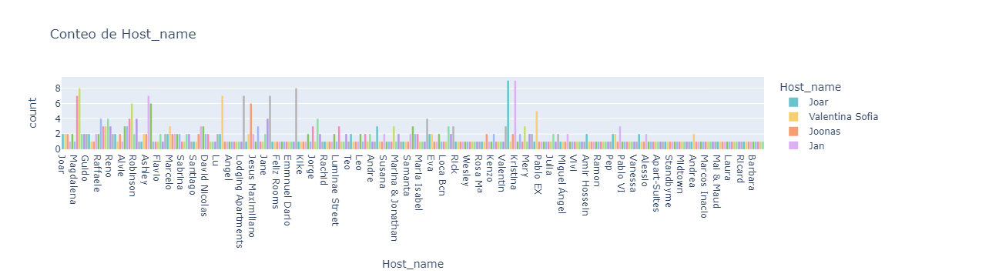

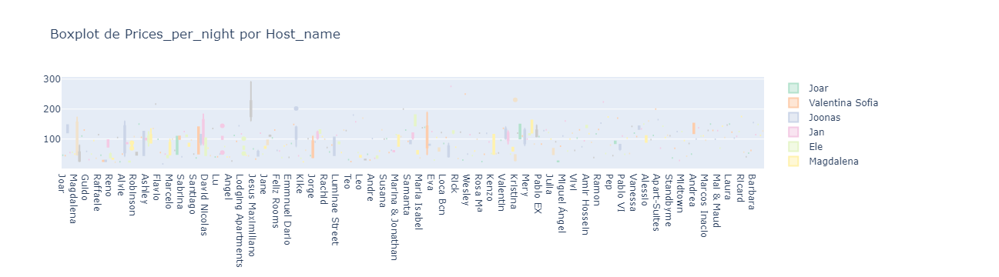

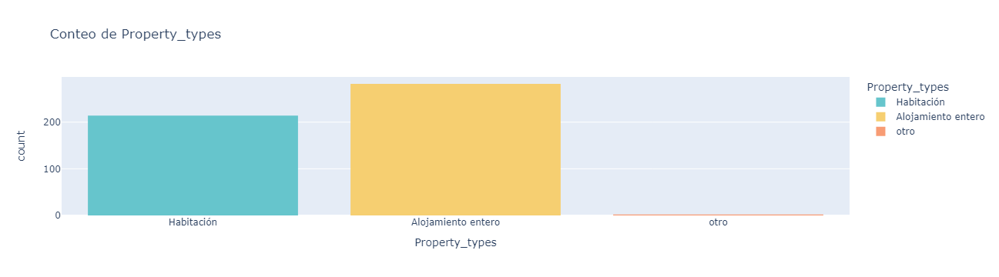

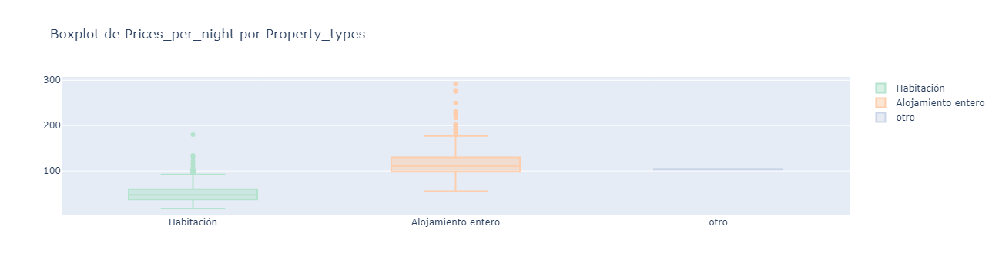

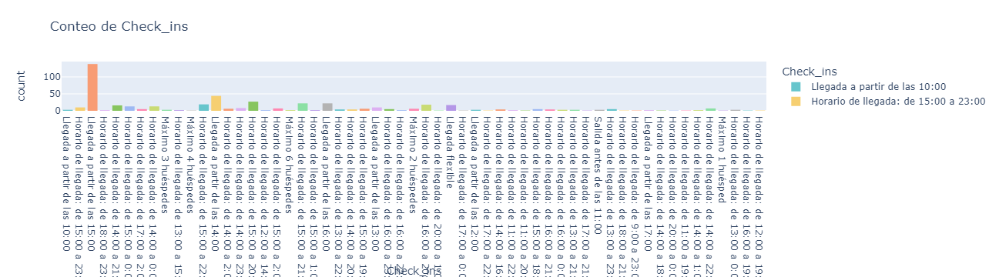

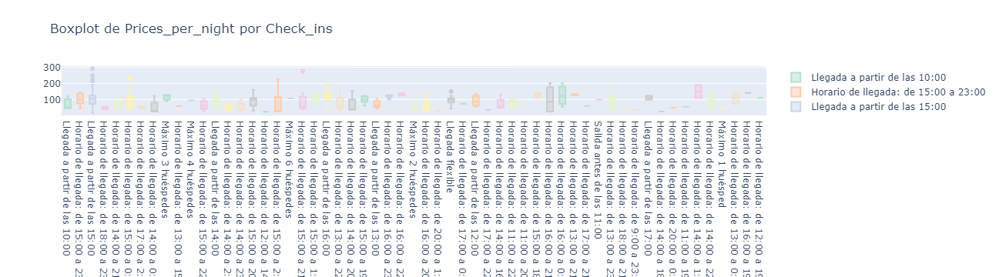

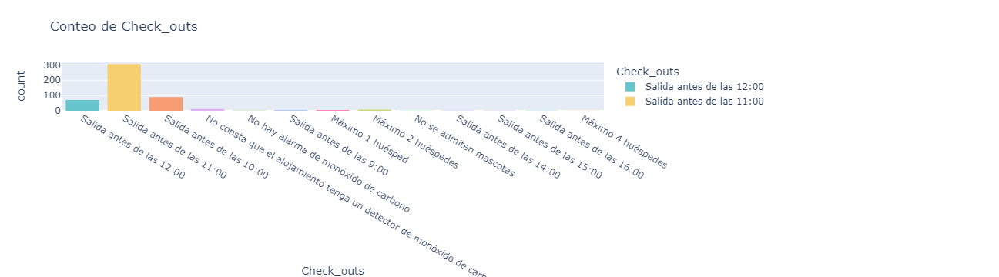

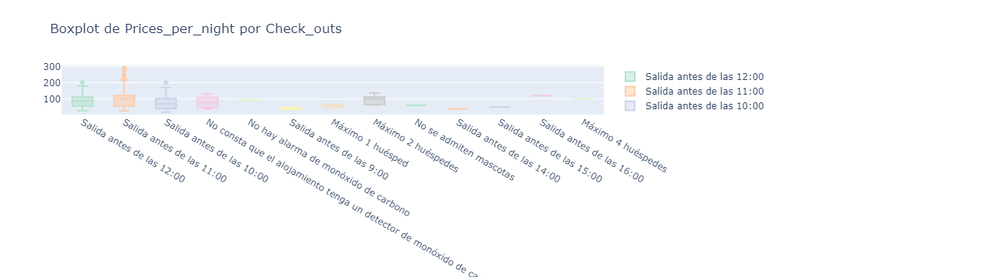

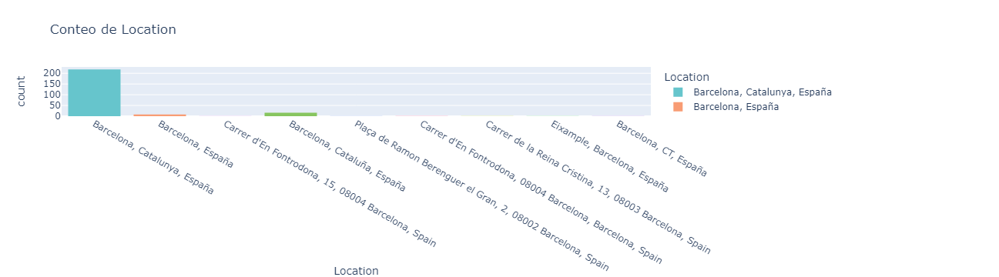

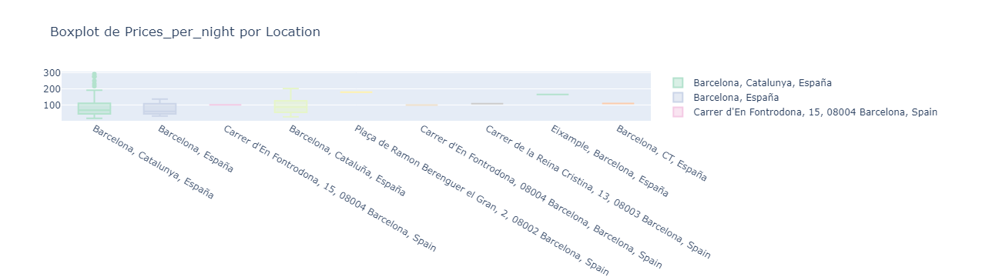

In [53]:
for columna in categoricas:
    eda_categoricas(columna = columna, df = df_filtered)
    

# Continuas

In [55]:
def eda_continuas(columna, df, target="Prices_per_night", showfliers=True):
    # Histograma con KDE
    hist_fig = px.histogram(df, x=columna, marginal="violin", opacity=0.7,color_discrete_sequence = px.colors.sequential.Viridis,
                            title=f"Histograma y KDE de {columna}")
    hist_fig.update_layout(showlegend=True)
    

    # Gráfico de dispersión
    scatter_fig = px.scatter(df, x=columna, y=target,color_discrete_sequence = px.colors.qualitative.Pastel,
                             title=f"Gráfico de dispersión de {target} por {columna}")

    
    # Boxplot
    box_fig = go.Figure()
    for category in df[columna].unique():
        if not pd.isna(category):
            
            box_fig.add_trace(go.Box(
                y=df[df[columna] == category][target],
                name=str(category),
                boxpoints='outliers' if showfliers else False,
                marker_color=px.colors.qualitative.Pastel2[df[columna].unique().tolist().index(category) % len(px.colors.qualitative.Pastel2)]
            ))

    # Mostrar gráficos
    hist_fig.show()
    scatter_fig.show()
    box_fig.show()

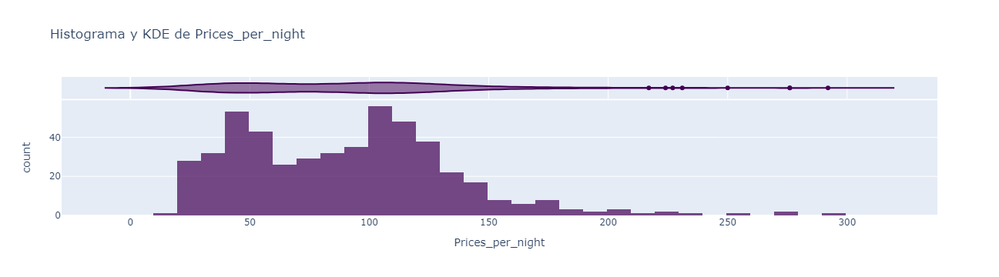

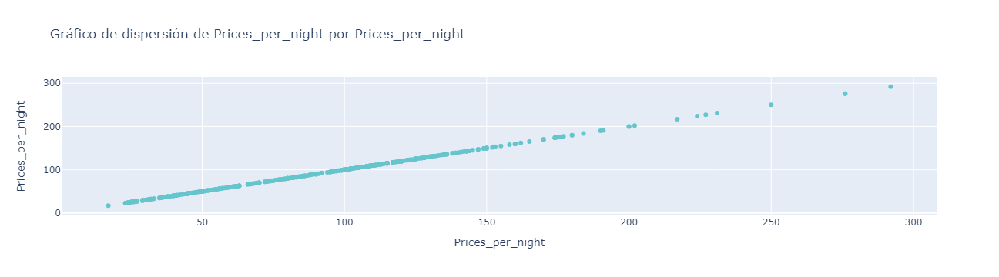

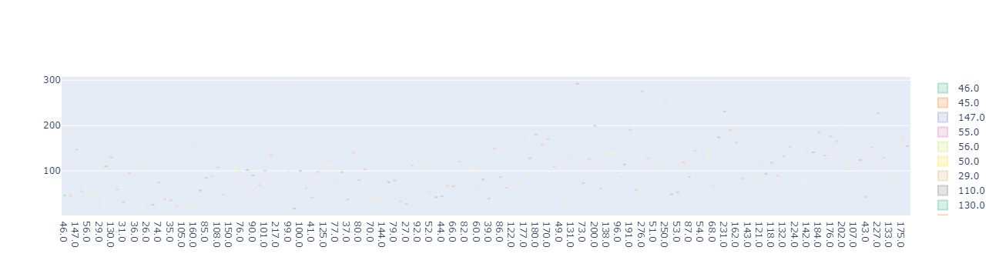

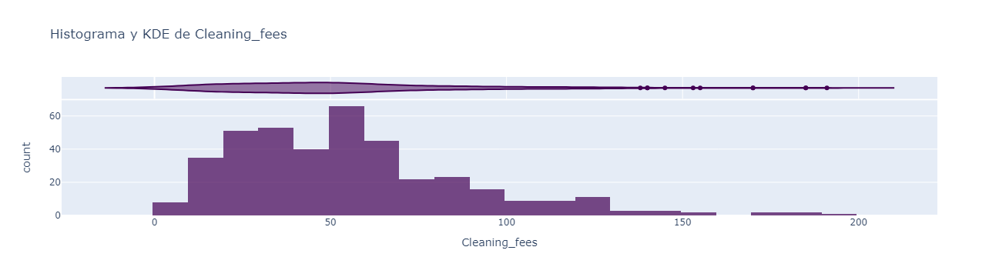

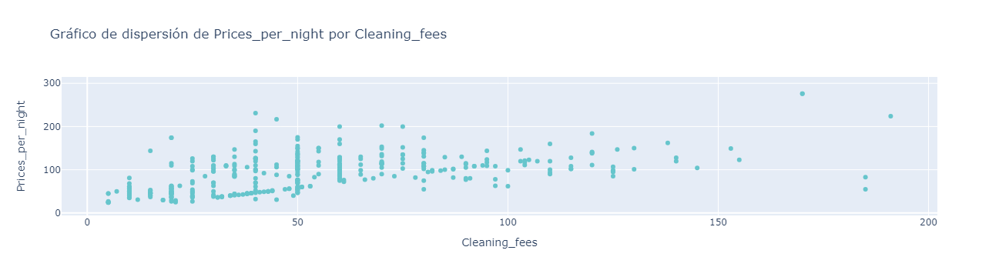

...

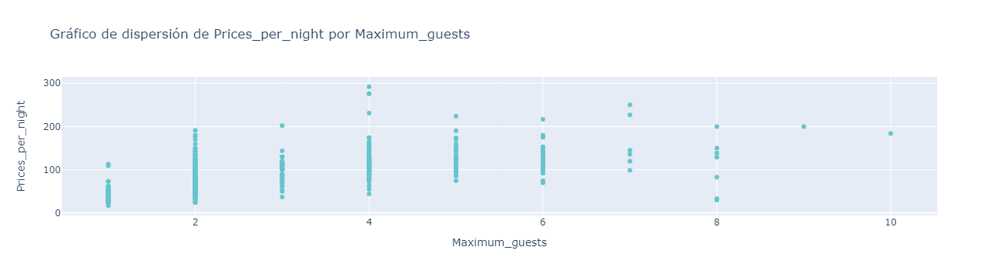

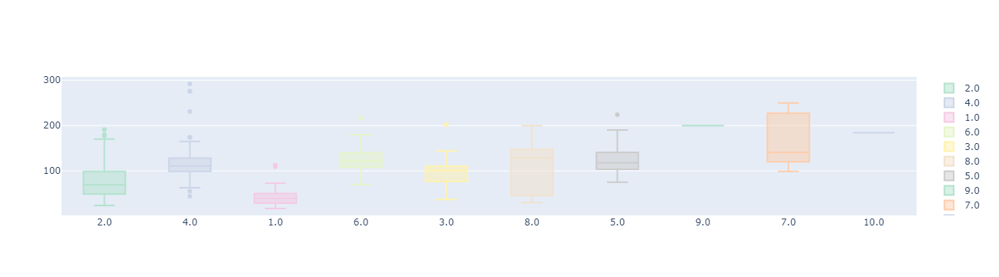

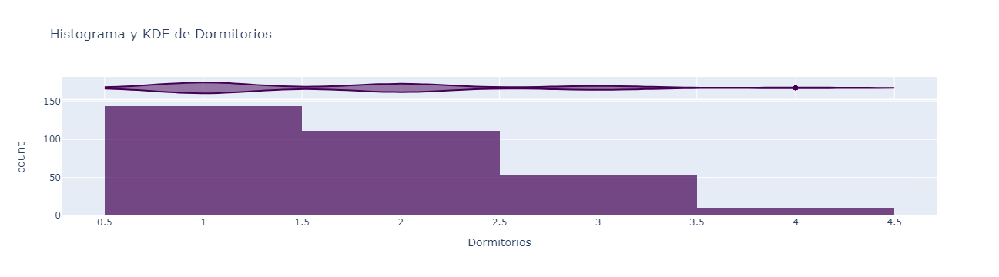

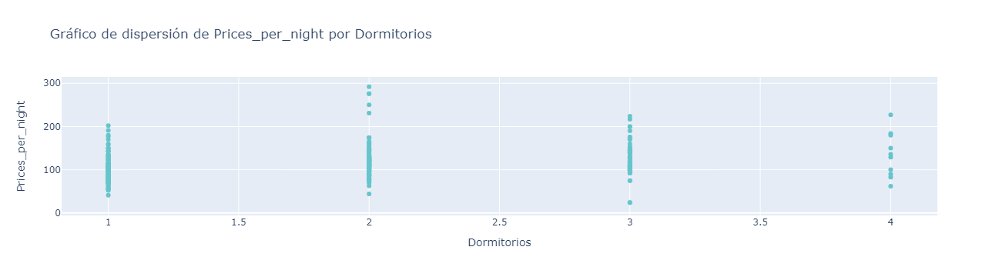

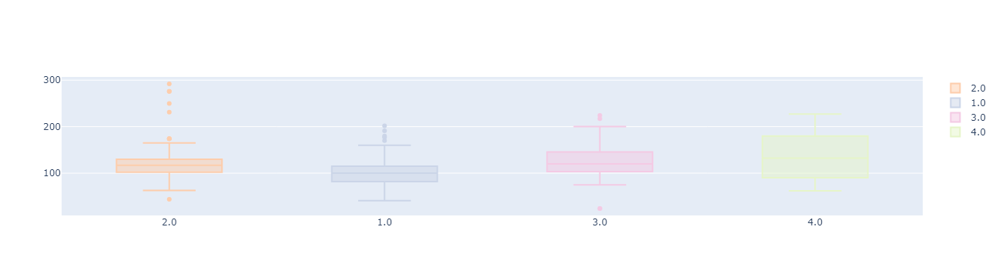

In [56]:
for columna in continuas:
    eda_continuas(columna = columna, df = df_filtered)

In [57]:
df.isna().sum()

urls                  0
timestamp             0
record_id             0
Titles                0
Host_name             0
Property_types        0
Prices_per_night      0
Check_ins             0
Check_outs            0
Cleaning_fees        97
Location            250
Ratings               0
Num_reviews           0
Camas                21
Baños               170
Maximum_guests        1
Dormitorios         180
dtype: int64

# Con log

In [59]:
def eda_continuas_log(columna, df, target="Prices_per_night", hue=None):
    # Aplicar transformación logarítmica a la columna
    df[f"log_{columna}"] = np.log1p(df[columna])
    
    # Histograma con KDE para la columna transformada
    hist_fig = px.histogram(df, x=f"log_{columna}", color=hue, marginal="violin", opacity=0.7,
                            title=f"Histograma y KDE de log({columna})")
    hist_fig.update_layout(showlegend=True)

    # Gráfico de dispersión para la columna transformada
    scatter_fig = px.scatter(df, x=f"log_{columna}", y=target, color=hue, 
                             title=f"Gráfico de dispersión de {target} por log({columna})")
    
    # Boxplot para la columna transformada
    box_fig = go.Figure()
    unique_hues = df[hue].unique() if hue else [None]
    
    for h in unique_hues:
        filtered_df = df[df[hue] == h] if hue else df
        box_fig.add_trace(go.Box(
            y=filtered_df[f"log_{columna}"],
            name=str(h) if h else f"log_{columna}",
            boxpoints="all"
        ))
    box_fig.update_layout(title=f"Boxplot de log({columna}) por {hue}" if hue else f"Boxplot de log({columna})")

    # Mostrar gráficos
    hist_fig.show()
    scatter_fig.show()
    box_fig.show()

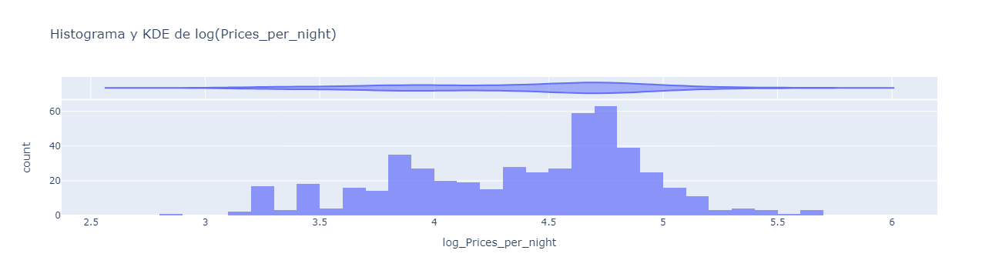

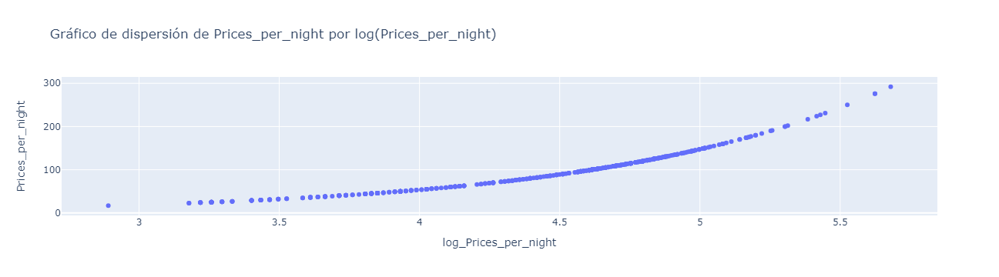

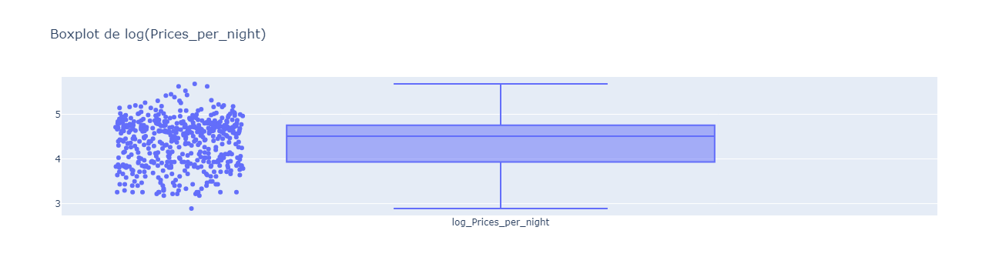

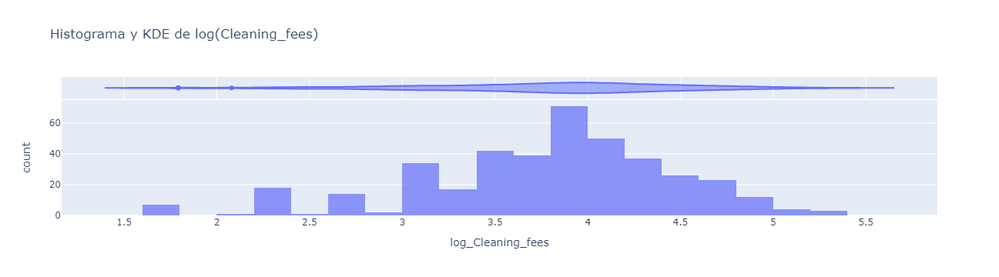

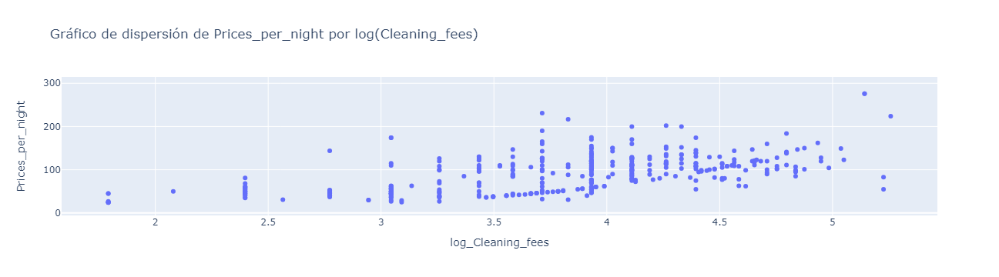

...

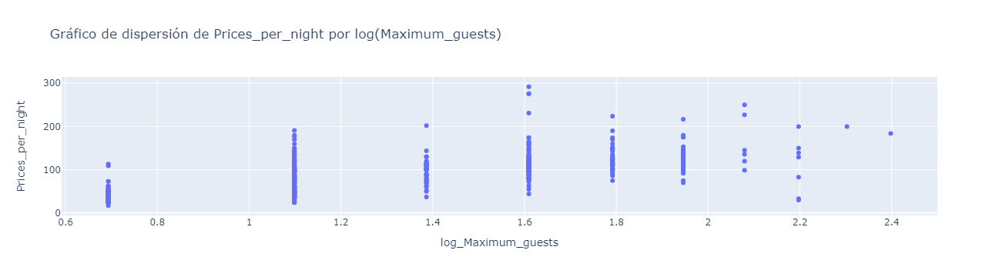

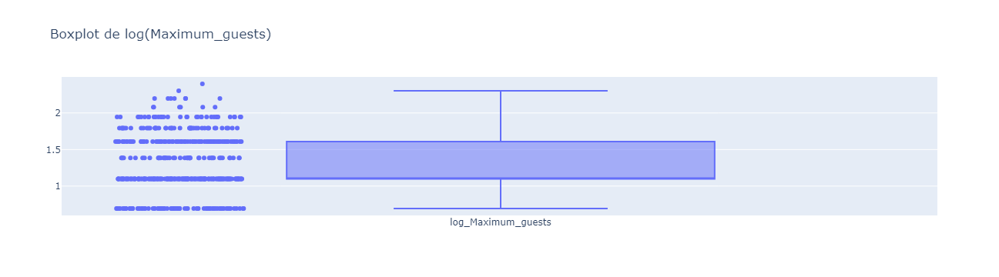

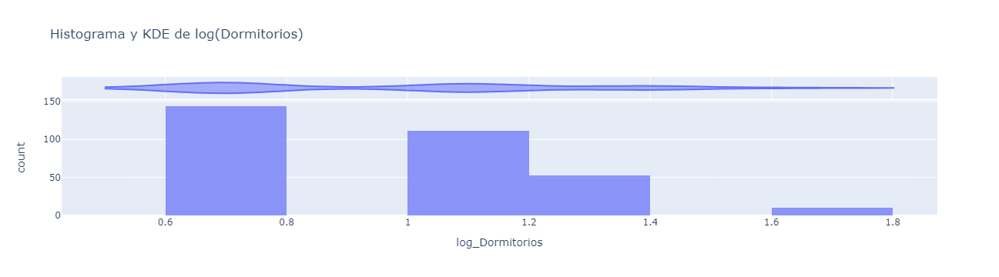

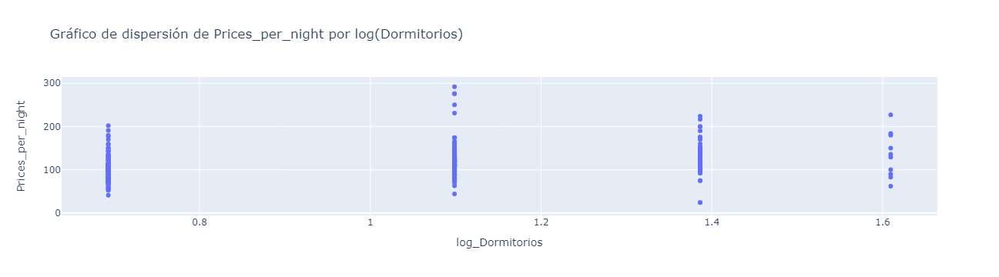

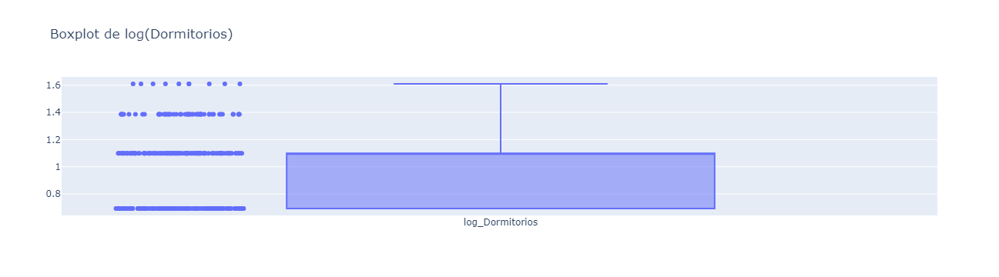

In [60]:
for columna in continuas:
    eda_continuas_log(columna = columna, df = df_filtered)

# Z_score

In [62]:
def z_score(columna, df, zl=3, zr=3):
    len_df = df.shape[0]
    
    # Calcular la media y desviación estándar
    mean = df[columna].mean()
    std = df[columna].std()
    
    # Calcular los límites izquierdo y derecho
    lim_l = mean - zl * std
    lim_r = mean + zr * std
    
    # Crear el histograma con KDE usando plotly
    hist_fig = px.histogram(df, x=columna, nbins=30, opacity=0.6, title=f"Distribución de {columna} con límites Z-score",
                            marginal="violin", histnorm="density")
    hist_fig.update_traces(marker=dict(color="lightblue"))
    
    # Añadir líneas verticales para los límites izquierdo y derecho
    hist_fig.add_vline(x=lim_l, line_width=2, line_dash="dash", line_color="orange", annotation_text="Límite Izquierdo")
    hist_fig.add_vline(x=lim_r, line_width=2, line_dash="dash", line_color="orange", annotation_text="Límite Derecho")
    
    # Mostrar el gráfico interactivo
    hist_fig.show()
    
    # Filtrar el DataFrame para valores dentro de los límites o NaNs
    df = df[df[columna].between(lim_l, lim_r) | df[columna].isna()]
    
    print(f"Filas restantes: {df.shape[0] / len_df * 100:.4}%")
    
    return df.reset_index(drop=True)

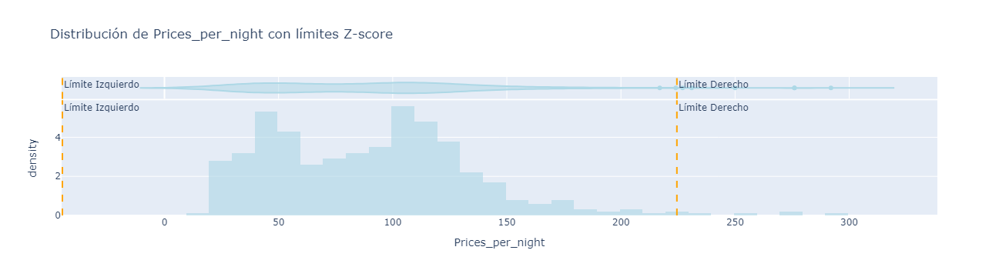

Filas restantes: 98.8%


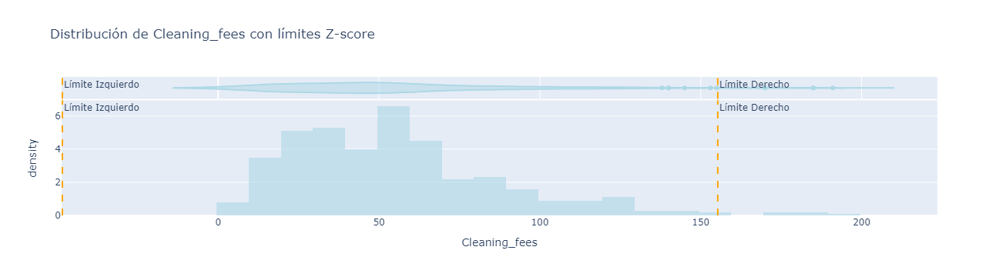

Filas restantes: 99.0%


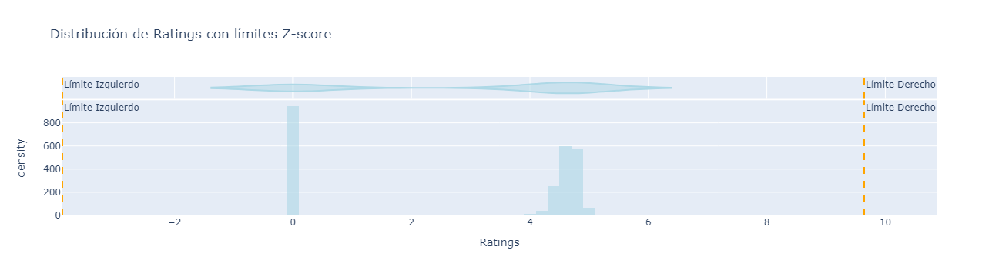

Filas restantes: 100.0%


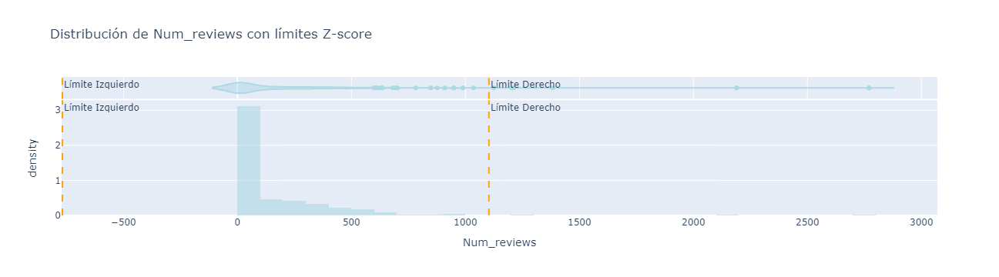

Filas restantes: 98.19%


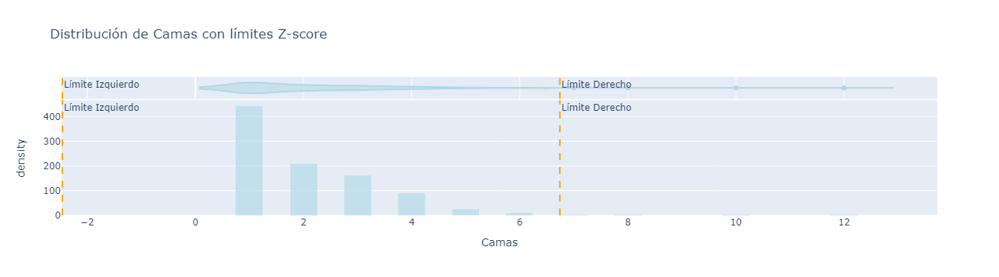

Filas restantes: 98.39%


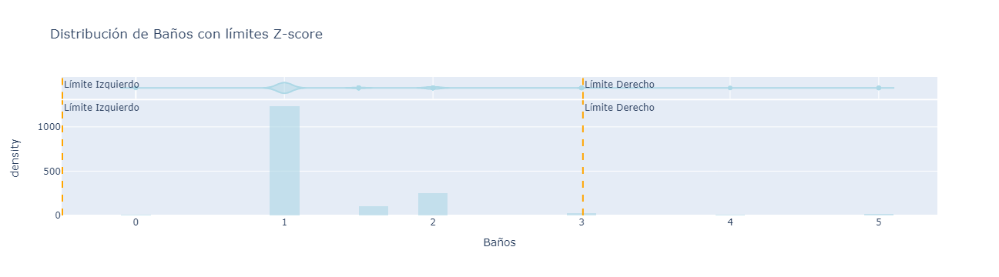

Filas restantes: 99.2%


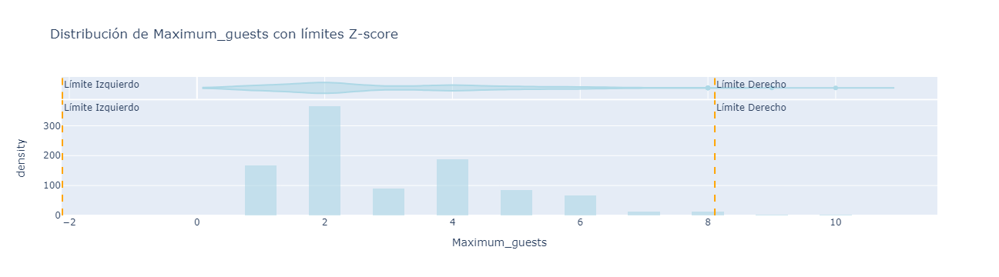

Filas restantes: 99.6%


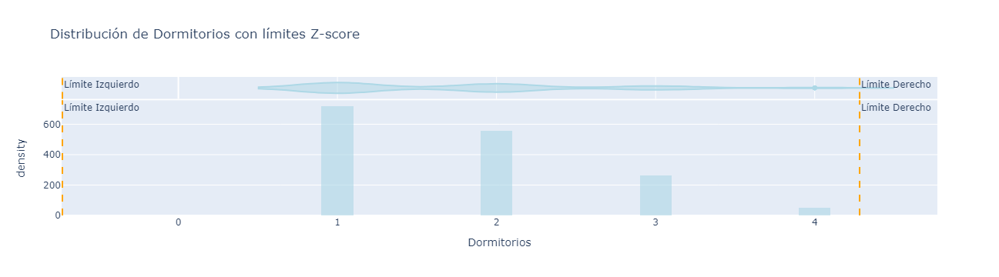

Filas restantes: 100.0%


In [63]:
for columna in continuas:
    df = z_score(columna = columna, df = df_filtered)